# Part 1. Exploratory Data Analysis and Visualization of Election Debate Videos

This notebook demonstrates the process of loading, exploring, and visualizing video frame data extracted from election debates, focusing on detected objects, human poses, and facial emotions.

## Import Necessary Libraries


In [1]:
import pandas as pd
import os
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import shutil
import random
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score
import matplotlib.ticker as ticker



## Load Data


In [2]:
# Define the video and frame number
video = 'chega-be'
frame_n = 3
processed_video_dir = os.path.join('processed', video)
# Load the data from a pickle file
data = pd.read_pickle(os.path.join('processed', video + '.pkl'))
frame_id = data.iloc[frame_n]['filename']


## Data Exploration

### View First Few Lines of the Data

In [3]:
data.head()

,filename,detections,poses,faces,text,embedding,fer
0,img00116.jpeg,"[[192, 39, 710, 611, person, 0.85546875], [106...","[[[0.5287994146347046, 0.38902580738067627, -0...","[[[0.5354748964309692, 0.4468356966972351, -0....","[=3, {2624, MRRAAA, O1:OI, OO:OO, vANPB)A]","[1, 253, 255, 1, 1, 255, 1, 1, 0, 10, 253, 8, ...","[{'location': [463, 750, 117, 404], 'embedding..."
1,img01657.jpeg,"[[360, 16, 782, 686, person, 0.91015625], [105...","[[[0.5852636694908142, 0.3498694896697998, -0....","[[[0.5782243013381958, 0.41002634167671204, -0...","[MRRAGA, 13.39, 13.50, vANPBRA, /, 2024]","[253, 2, 253, 0, 254, 254, 3, 253, 255, 8, 0, ...","[{'location': [597, 899, 90, 393], 'embedding'..."
2,img00589.jpeg,"[[669, 16, 610, 686, person, 0.93359375], [26,...","[[[0.274549663066864, 0.38907337188720703, -0....","[[[0.27605170011520386, 0.4545535743236542, -0...","[=3, 1, MORRAGA, 03.54, 04834, vANPBRA, 2824]","[253, 2, 2, 0, 254, 253, 2, 254, 3, 6, 0, 6, 5...","[{'location': [160, 444, 127, 411], 'embedding..."
3,img00264.jpeg,"[[631, 38, 633, 673, person, 0.94140625], [9, ...","[[[0.28526628017425537, 0.4065382480621338, -0...","[[[0.26723700761795044, 0.4672597646713257, -0...","[23, 82524, MORRAGA, 01.46, 01.21, vANPBRA]","[253, 2, 0, 6, 254, 254, 0, 254, 6, 9, 0, 4, 0...","[{'location': [194, 472, 135, 414], 'embedding..."
4,img00070.jpeg,"[[202, 33, 726, 610, person, 0.87890625], [107...","[[[0.5045007467269897, 0.4107182025909424, -0....","[[[0.5132942199707031, 0.46098387241363525, -0...","[=3, 82624, MPRRIAGA, 00.25, OO:OO, vANPBRA]","[1, 253, 255, 4, 0, 254, 3, 1, 1, 14, 253, 6, ...","[{'location': [434, 724, 131, 421], 'embedding..."


### Detailed Data Structure

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2204 entries, 0 to 2203
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filename    2204 non-null   object
 1   detections  2204 non-null   object
 2   poses       2204 non-null   object
 3   faces       2204 non-null   object
 4   text        2204 non-null   object
 5   embedding   2204 non-null   object
 6   fer         2204 non-null   object
dtypes: object(7)
memory usage: 120.7+ KB


### Access Information for a Specific Frame


In [69]:
data.iloc[frame_n]

array([253, 255, 254, ...,   7,   3,   0], dtype=uint8)

In [60]:
data.iloc[frame_n]['faces'][0]

[[0.5555580854415894, 0.4284960925579071, -0.023837804794311523, 0.0, 0.0],
 [0.5524718761444092, 0.3795461058616638, -0.0397968515753746, 0.0, 0.0],
 [0.556704044342041, 0.39534297585487366, -0.02213282138109207, 0.0, 0.0],
 [0.5475445985794067, 0.3378707766532898, -0.026595134288072586, 0.0, 0.0],
 [0.5515999794006348, 0.36559051275253296, -0.04171518608927727, 0.0, 0.0],
 [0.5521265268325806, 0.34862300753593445, -0.03808341547846794, 0.0, 0.0],
 [0.5545610189437866, 0.308086633682251, -0.01635066792368889, 0.0, 0.0],
 [0.5138033628463745, 0.31433674693107605, 0.027299726381897926, 0.0, 0.0],
 [0.554108738899231, 0.27233898639678955, -0.009614194743335247, 0.0, 0.0],
 [0.5530356168746948, 0.2539399564266205, -0.009917537681758404, 0.0, 0.0],
 [0.5508213639259338, 0.1953383833169937, 0.0019262388814240694, 0.0, 0.0],
 [0.5557208061218262, 0.4331280589103699, -0.0231783390045166, 0.0, 0.0],
 [0.5564308166503906, 0.4375103712081909, -0.02094287984073162, 0.0, 0.0],
 [0.5572961568832397

In [63]:
fer_info = data.iloc[frame_n]
fer_info = data.iloc[frame_n]['fer']
for i in range(len(fer_info)):
    print(fer_info[i]['location'])
print(fer_info)

[593, 888, 99, 395]
[1126, 1185, 493, 553]
[{'location': [593, 888, 99, 395], 'embedding': [-0.06440681219100952, -0.0072560119442641735, -0.0732303112745285, 0.034056540578603745, 0.019103659316897392, 0.007004979532212019, -0.01700413040816784, -0.06737077236175537, 0.17382439970970154, 0.08911339193582535, -0.02195024862885475, -0.0408603698015213, -0.045708395540714264, -0.062102608382701874, 0.14847946166992188, -0.011756791733205318, 0.08999399840831757, -0.010232008062303066, 0.04694589599967003, -0.06849818676710129, -0.03103158436715603, -0.06285036355257034, 0.022017227485775948, -0.053606849163770676, -0.051587462425231934, -0.23262494802474976, -0.13091938197612762, -0.06397565454244614, -0.07038795948028564, 0.1958680897951126, 0.0728955864906311, -0.012133374810218811, 0.07517409324645996, 0.061723604798316956, -0.0743768960237503, 0.01709645427763462, -0.16229449212551117, 0.11025380343198776, 0.00875854678452015, 0.1138133853673935, -0.022057916969060898, 0.005837458651

## Visualization and Detailed Analysis
### Display the Image of the Selected Frame


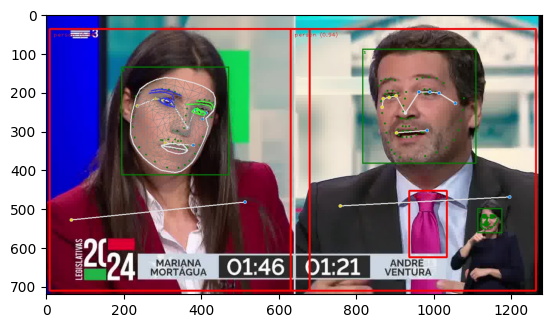

In [6]:
# Load and display the original and processed images
img = Image.open(os.path.join('videos', video, data.iloc[frame_n]['filename']))
pimg = Image.open(os.path.join('processed', video, frame_id))

plt.imshow(pimg)
plt.show()


### Object Detection and Analysis

In [7]:
# Display detected objects and their confidence levels
object_count = 0
for objects in data.iloc[frame_n]['detections']:
    object_count += 1
    print(f"Object {object_count}: {objects[4]} - Confidence: {objects[5]}")

Object 1: person - Confidence: 0.94140625
Object 2: person - Confidence: 0.9375
Object 3: tie - Confidence: 0.5234375


### Pose Information


In [8]:
# Print pose data
pose = data.iloc[frame_n]['poses']
print(f"Pose: {pose}")


Pose: [[[0.28526628017425537, 0.4065382480621338, -0.8409263491630554, 0.9990274906158447, 0.9963582158088684], [0.30122217535972595, 0.34148073196411133, -0.7773299813270569, 0.9978905320167542, 0.994803249835968], [0.3146304488182068, 0.34943687915802, -0.7779709100723267, 0.9978095889091492, 0.9952929615974426], [0.32286304235458374, 0.35403692722320557, -0.7779154777526855, 0.9981732368469238, 0.9937784075737], [0.25375455617904663, 0.3148488998413086, -0.8025708198547363, 0.9985843896865845, 0.9916698932647705], [0.2357369065284729, 0.30632007122039795, -0.803433895111084, 0.998816728591919, 0.9922560453414917], [0.22055895626544952, 0.30192720890045166, -0.8039631843566895, 0.9987919926643372, 0.9893028140068054], [0.31508004665374756, 0.37621068954467773, -0.3755839765071869, 0.9989989399909973, 0.9953952431678772], [0.1837122142314911, 0.3289715051651001, -0.49076712131500244, 0.9981598258018494, 0.9847588539123535], [0.2970382273197174, 0.46904128789901733, -0.6759902238845825

### Pose Visibility Score

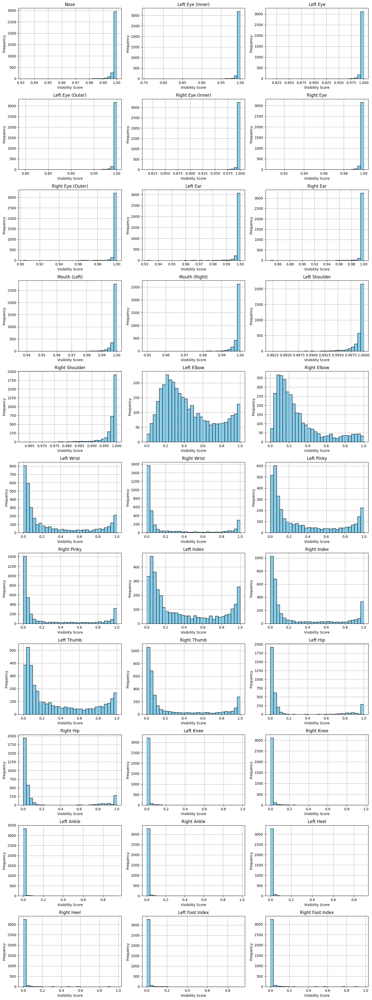

In [9]:
# Assuming 'data' is your DataFrame and each frame's pose data is structured correctly
body_parts = [
    "Nose", "Left Eye (Inner)", "Left Eye", "Left Eye (Outer)", "Right Eye (Inner)",
    "Right Eye", "Right Eye (Outer)", "Left Ear", "Right Ear", "Mouth (Left)",
    "Mouth (Right)", "Left Shoulder", "Right Shoulder", "Left Elbow", "Right Elbow",
    "Left Wrist", "Right Wrist", "Left Pinky", "Right Pinky", "Left Index",
    "Right Index", "Left Thumb", "Right Thumb", "Left Hip", "Right Hip",
    "Left Knee", "Right Knee", "Left Ankle", "Right Ankle", "Left Heel",
    "Right Heel", "Left Foot Index", "Right Foot Index"
]

# Initialize a dictionary to hold visibility scores for each body part
visibility_scores = {part: [] for part in body_parts}

# Extract visibility scores
for index, row in data.iterrows():
    poses = row['poses']
    for pose in poses:
        for i, keypoint in enumerate(pose):
            if len(keypoint) >= 5:  # Ensure there is a visibility score
                visibility = keypoint[3]  # Assuming the 5th element is visibility
                visibility_scores[body_parts[i]].append(visibility)

# Plotting
fig, axes = plt.subplots(nrows=11, ncols=3, figsize=(15, 40))  # Adjust the size and layout
axes = axes.flatten()

for i, (part, scores) in enumerate(visibility_scores.items()):
    ax = axes[i]
    ax.hist(scores, bins=30, color='skyblue', edgecolor='black')
    ax.set_title(part)
    ax.set_xlabel('Visibility Score')
    ax.set_ylabel('Frequency')
    ax.grid(True)

plt.tight_layout()
plt.show()


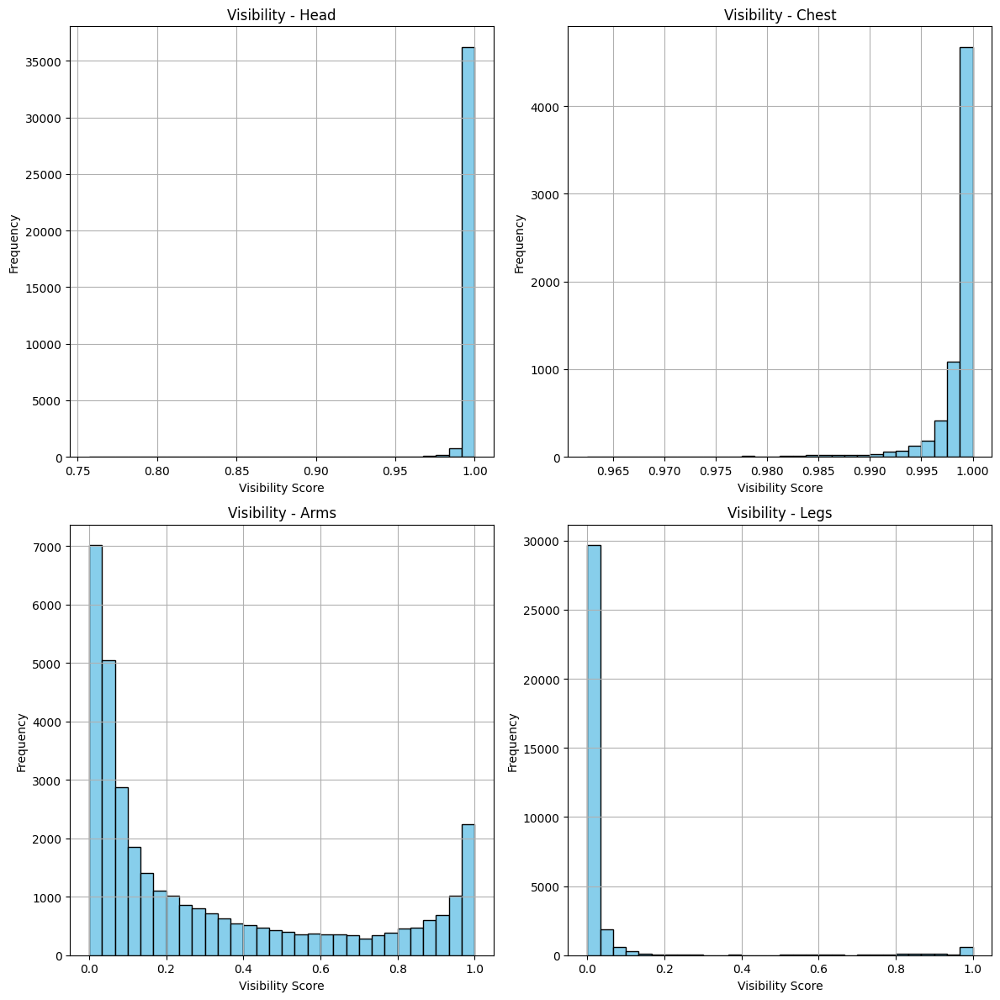

In [10]:
# Body part groupings
groupings = {
    "Head": ["Nose", "Left Eye (Inner)", "Left Eye", "Left Eye (Outer)", "Right Eye (Inner)", "Right Eye", "Right Eye (Outer)", "Left Ear", "Right Ear", "Mouth (Left)", "Mouth (Right)"],
    "Chest": ["Left Shoulder", "Right Shoulder"],
    "Arms": ["Left Elbow", "Right Elbow", "Left Wrist", "Right Wrist", "Left Pinky", "Right Pinky", "Left Index", "Right Index", "Left Thumb", "Right Thumb"],
    "Legs": ["Left Hip", "Right Hip", "Left Knee", "Right Knee", "Left Ankle", "Right Ankle", "Left Heel", "Right Heel", "Left Foot Index", "Right Foot Index"]
}

# Initialize a dictionary to hold visibility scores for each group
group_visibility_scores = {group: [] for group in groupings}

# Map individual keypoints to the groups
for part, scores in visibility_scores.items():
    for group, parts in groupings.items():
        if part in parts:
            group_visibility_scores[group].extend(scores)
# Adjusted plotting for grouped visibility scores
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))  # Adjust for 4 groups
axes = axes.flatten()

for i, (group, scores) in enumerate(group_visibility_scores.items()):
    ax = axes[i]
    ax.hist(scores, bins=30, color='skyblue', edgecolor='black')
    ax.set_title(f"Visibility - {group}")
    ax.set_xlabel('Visibility Score')
    ax.set_ylabel('Frequency')
    ax.grid(True)

plt.tight_layout()
plt.show()


### Clustering 2D - 

C:\Users\maria\AppData\Local\Temp\ipykernel_26636\4022327463.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', num_clusters)  # Get a colormap with enough colors


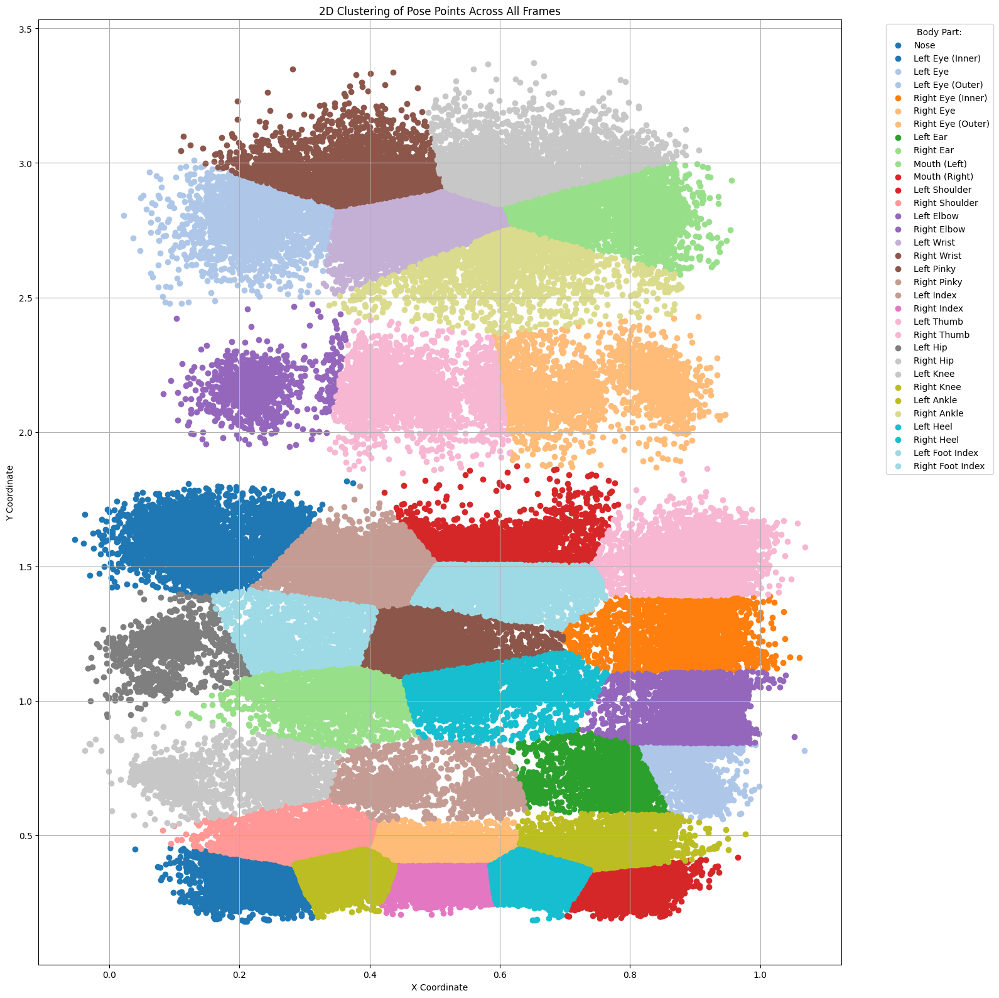

In [11]:
data_points = []  # Initialize outside the frame loop to collect data across all frames

for frame_n in range(len(data)):
    pose_data = data.iloc[frame_n]['poses']
    for pose in pose_data:
        for point in pose:
            x, y, _, visibility, presence = point  # Extract x and y coordinates
            data_points.append([x, y])  # Append only x and y for 2D clustering

data_points = np.array(data_points)
num_clusters = min(len(body_parts), len(data_points))  # Adjust the number of clusters

kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(data_points)
labels = kmeans.labels_

fig, ax = plt.subplots(figsize=(16, 16))  # Use subplots for a simple 2D plot

colors = cm.get_cmap('tab20', num_clusters)  # Get a colormap with enough colors

for i in range(num_clusters):
    cluster_points = data_points[labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1],
               color=colors(i), label=body_parts[i] if i < len(body_parts) else f'Cluster {i+1}')

ax.set_title('2D Clustering of Pose Points Across All Frames')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.legend(title="Body Part:", bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.grid(True)
plt.tight_layout()  # Adjust layout to make room for legend
plt.show()

Use bigger groups (groupings)

C:\Users\maria\AppData\Local\Temp\ipykernel_26636\1041006032.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab10', len(unique_groups))


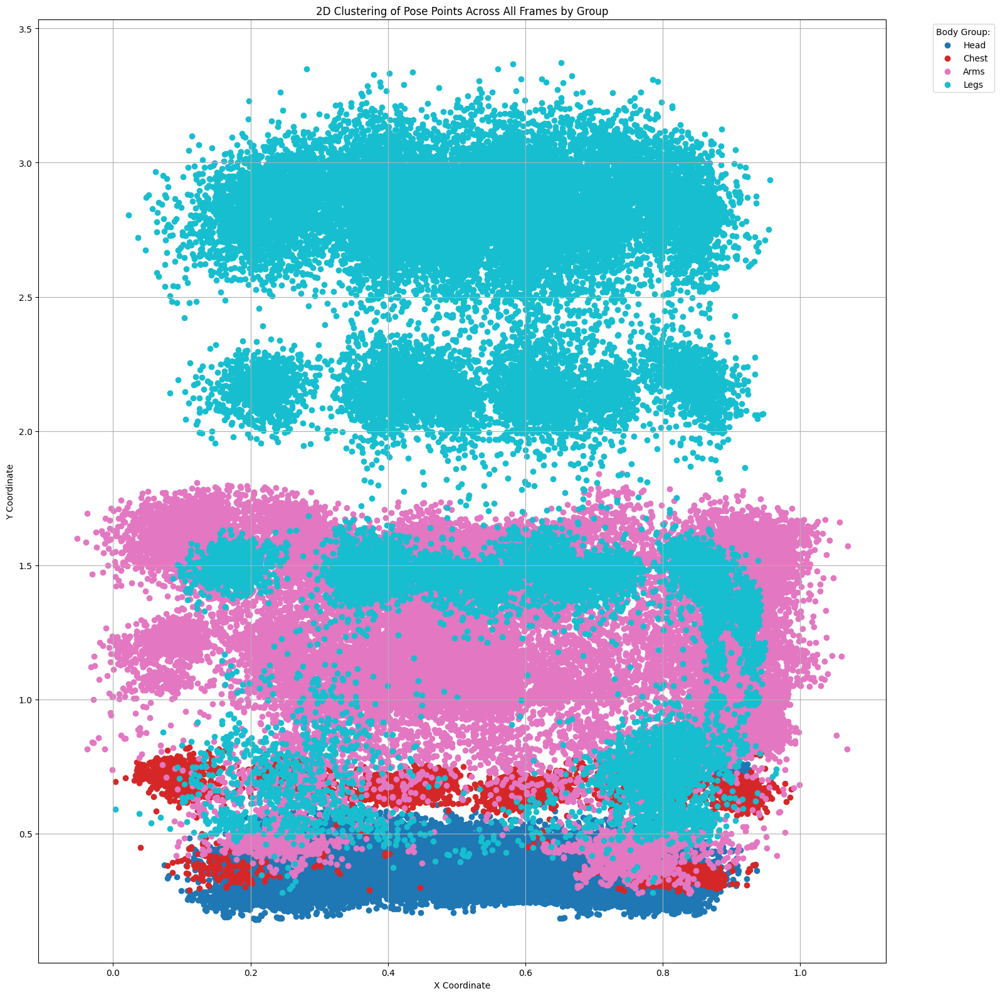

In [12]:
# Initialize a list to store data points and their corresponding group labels
data_points = []
group_labels = []

# Collect data by group
for frame_n in range(len(data)):
    pose_data = data.iloc[frame_n]['poses']
    for pose in pose_data:
        for point, part_name in zip(pose, body_parts):
            x, y, _, visibility, presence = point
            # Determine which group each point belongs to
            for group, parts in groupings.items():
                if part_name in parts:
                    data_points.append([x, y])
                    group_labels.append(group)
                    break

# Convert collected data to a NumPy array
data_points = np.array(data_points)
group_labels = np.array(group_labels)

# Map group labels to integers for clustering
unique_groups = list(groupings.keys())
group_indices = {group: i for i, group in enumerate(unique_groups)}
integer_labels = np.array([group_indices[label] for label in group_labels])

# Perform K-means clustering based on the number of unique groups
kmeans = KMeans(n_clusters=len(unique_groups))
kmeans.fit(data_points)
labels = kmeans.labels_

fig, ax = plt.subplots(figsize=(16, 16))

# Use a colormap with distinct colors for each group
colors = cm.get_cmap('tab10', len(unique_groups))

# Scatter plot for each group with different colors
for i, group in enumerate(unique_groups):
    # Filter points belonging to the current group
    cluster_points = data_points[integer_labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1],
               color=colors(i), label=group)

ax.set_title('2D Clustering of Pose Points Across All Frames by Group')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.legend(title="Body Group:", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

### Clustering of Visibility Scores

C:\Users\maria\AppData\Local\Temp\ipykernel_26636\277971689.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', num_clusters)


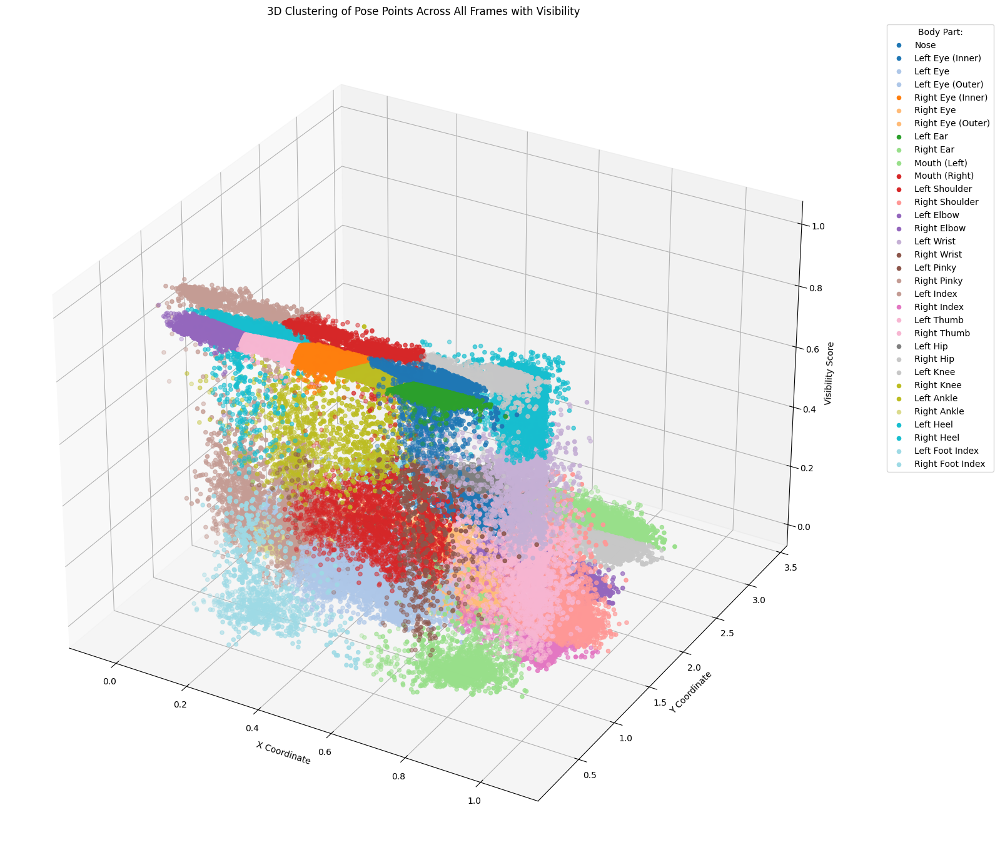

In [13]:
data_points = []  # Initialize outside the frame loop to collect data across all frames

for frame_n in range(len(data)):
    pose_data = data.iloc[frame_n]['poses']
    for pose in pose_data:
        for point in pose:
            x, y, _, visibility, presence= point
            data_points.append([x, y, visibility])

data_points = np.array(data_points)
num_clusters = min(len(body_parts), len(data_points))  # Adjust the number of clusters to match body parts if possible

kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(data_points)
labels = kmeans.labels_

fig = plt.figure(figsize=(16, 16))
ax = fig.add_subplot(111, projection='3d')

colors = cm.get_cmap('tab20', num_clusters)


for i in range(num_clusters):
    cluster_points = data_points[labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
                color=colors(i), label=body_parts[i] if i < len(body_parts) else f'Cluster {i+1}')

ax.set_title('3D Clustering of Pose Points Across All Frames with Visibility')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Visibility Score')
ax.legend(title="Body Part:", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


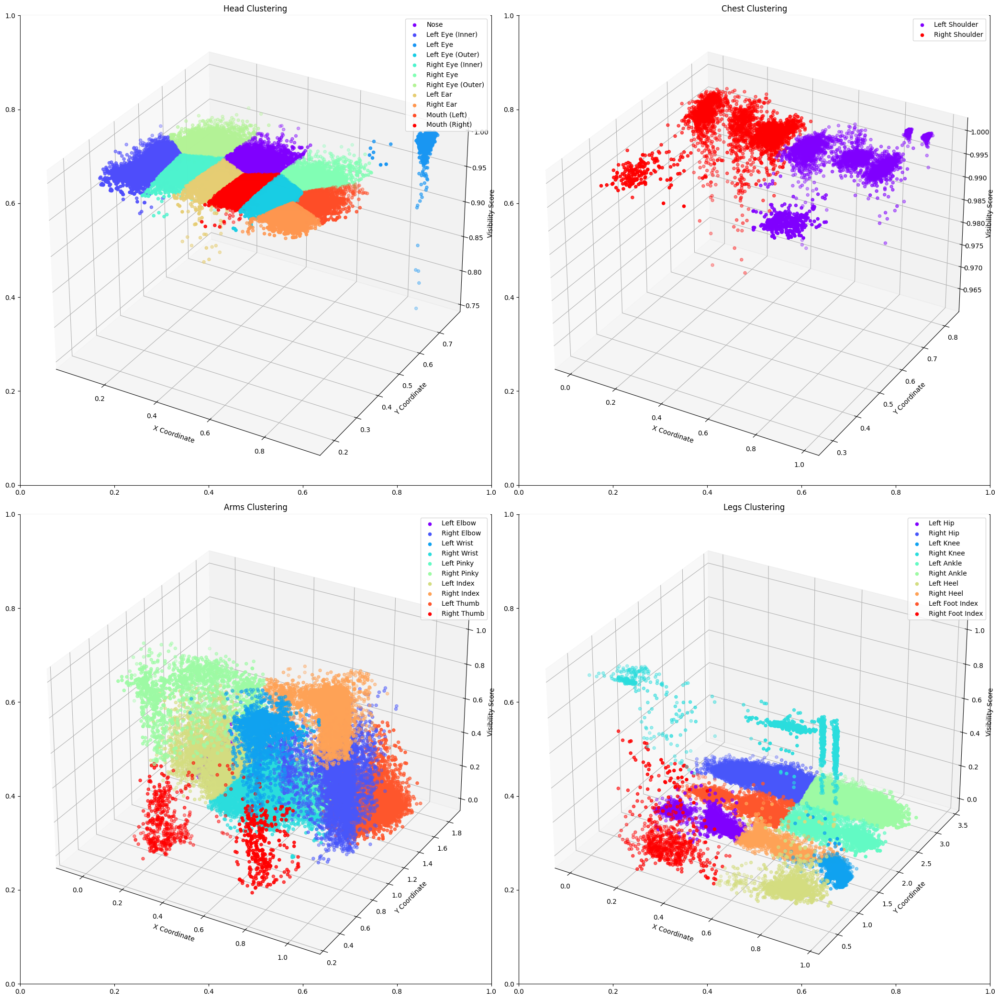

In [14]:
fig, axes = plt.subplots(2, 2, figsize=(21, 21))
axes = axes.flatten()

for idx, (group, parts) in enumerate(groupings.items()):
    data_points = []

    # Collecting data for each group
    for frame_n in range(len(data)):
        pose_data = data.iloc[frame_n]['poses']
        for pose in pose_data:
            for point, part_name in zip(pose, body_parts):
                x, y, _, visibility, _ = point
                if part_name in parts:
                    data_points.append([x, y, visibility])

    if data_points:
        data_points = np.array(data_points)
        num_clusters = min(len(parts), len(data_points)) 

        # Perform K-means clustering
        kmeans = KMeans(n_clusters=num_clusters)
        kmeans.fit(data_points)
        labels = kmeans.labels_

        # Generate colors for each body part within the group
        colors = cm.rainbow(np.linspace(0, 1, num_clusters))

        # Plotting the results for this group
        ax = axes[idx]
        ax = fig.add_subplot(2, 2, idx + 1, projection='3d')
        for i in range(num_clusters):
            cluster_points = data_points[labels == i]
            ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
                       color=colors[i], label=parts[i] if i < len(parts) else f'Cluster {i+1}')

        ax.set_title(f'{group} Clustering')
        ax.set_xlabel('X Coordinate')
        ax.set_ylabel('Y Coordinate')
        ax.set_zlabel('Visibility Score')
        ax.legend()

plt.tight_layout()
plt.show()

C:\Users\maria\AppData\Local\Temp\ipykernel_26636\57128157.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_labels))


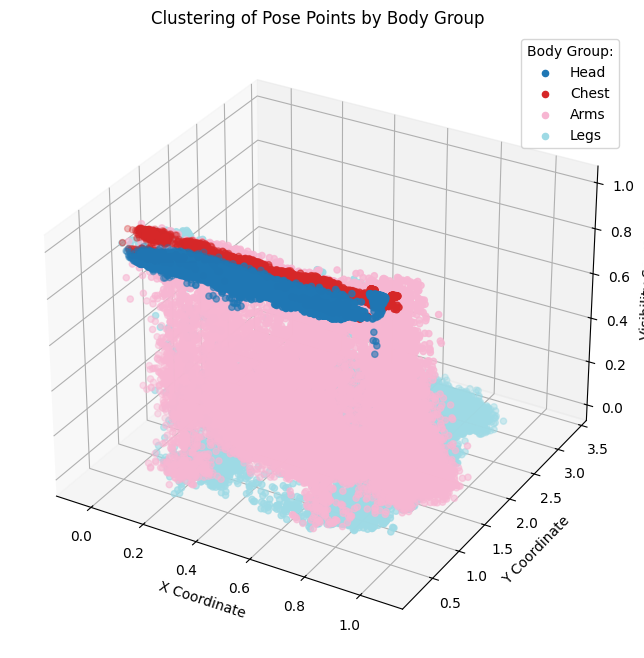

In [15]:
# Assuming 'data' and 'body_parts' are predefined
data_points = []
labels_list = []  # To track which group each point belongs to

# Collect data by group
for frame_n in range(len(data)):
    pose_data = data.iloc[frame_n]['poses']
    for pose in pose_data:
        for point, part_name in zip(pose, body_parts):
            x, y, _, visibility, _ = point
            for group, parts in groupings.items():
                if part_name in parts:
                    data_points.append([x, y, visibility])
                    labels_list.append(group)  # Track the group of each point
                    break  # Stop once the correct group is found

# Convert collected data to a NumPy array
data_points = np.array(data_points)

# Map group labels to integers for clustering
unique_labels = list(groupings.keys())
integer_labels = [unique_labels.index(label) for label in labels_list]

# Plotting the results
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Use a colormap with distinct colors for each group
colors = cm.get_cmap('tab20', len(unique_labels))

for i, group in enumerate(unique_labels):
    # Select data points belonging to the current group
    group_points = data_points[np.array(integer_labels) == i]
    ax.scatter(group_points[:, 0], group_points[:, 1], group_points[:, 2], color=colors(i), label=group)

ax.set_title('Clustering of Pose Points by Body Group')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Visibility Score')
ax.legend(title="Body Group:")
plt.grid(True)
plt.show()

### Presence Score

#### Histogram

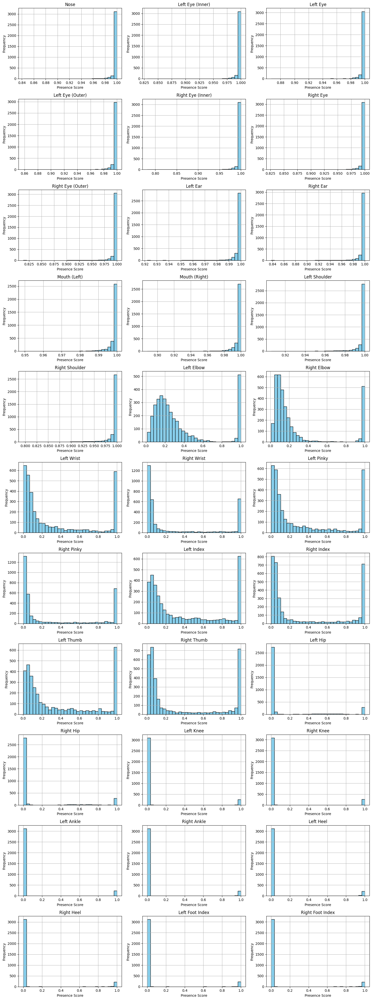

In [16]:
presence_scores = {part: [] for part in body_parts}

# Extract presence scores
for index, row in data.iterrows():
    poses = row['poses']
    for pose in poses:
        for i, keypoint in enumerate(pose):
            if len(keypoint) >= 5:  # Ensure there is a presence score
                presence = keypoint[4]  # Assuming the 5th element is presence
                presence_scores[body_parts[i]].append(presence)

# Plotting
fig, axes = plt.subplots(nrows=11, ncols=3, figsize=(15, 40))  # Adjust the size and layout
axes = axes.flatten()

for i, (part, scores) in enumerate(presence_scores.items()):
    ax = axes[i]
    ax.hist(scores, bins=30, color='skyblue', edgecolor='black')
    ax.set_title(part)
    ax.set_xlabel('Presence Score')
    ax.set_ylabel('Frequency')
    ax.grid(True)

plt.tight_layout()
plt.show()

##### Grouped by Body Parts

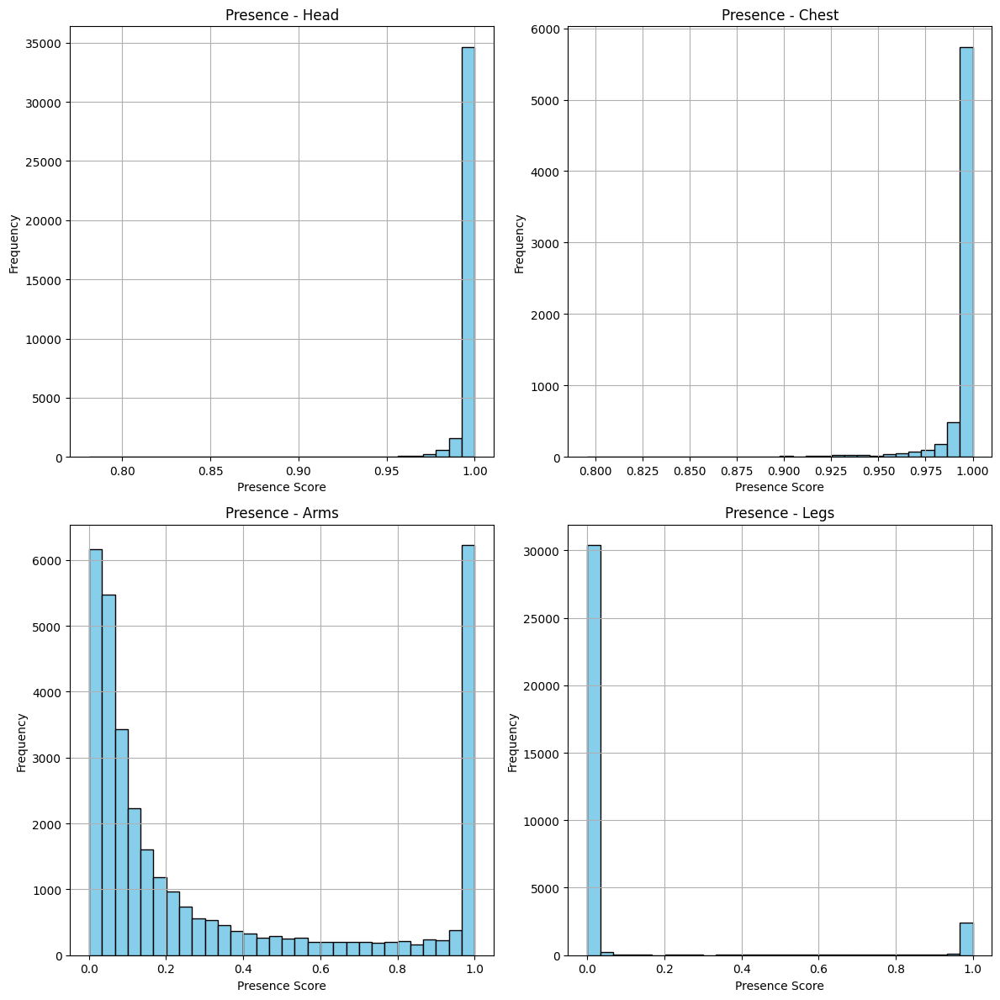

In [17]:
import matplotlib.pyplot as plt

# Assuming 'presence_scores' is a dictionary containing lists of presence scores for each body part
# Initialize a dictionary to hold presence scores for each group
group_presence_scores = {group: [] for group in groupings}

# Map individual keypoints to the groups
for part, scores in presence_scores.items():
    for group, parts in groupings.items():
        if part in parts:
            group_presence_scores[group].extend(scores)

# Plotting grouped presence scores
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))  # Adjust for 4 groups
axes = axes.flatten()

for i, (group, scores) in enumerate(group_presence_scores.items()):
    ax = axes[i]
    ax.hist(scores, bins=30, color='skyblue', edgecolor='black')
    ax.set_title(f"Presence - {group}")
    ax.set_xlabel('Presence Score')
    ax.set_ylabel('Frequency')
    ax.grid(True)

plt.tight_layout()
plt.show()


#### Clustering

C:\Users\maria\AppData\Local\Temp\ipykernel_26636\3952129720.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', num_clusters)


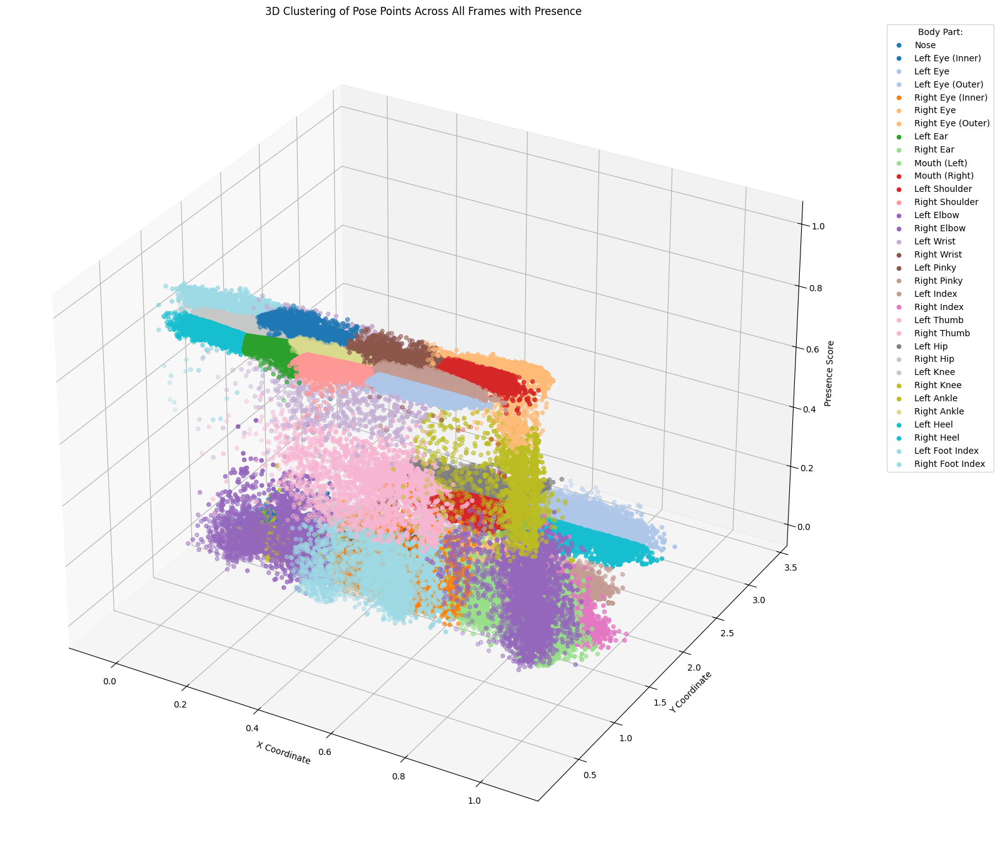

In [18]:
# Initialize outside the frame loop to collect data across all frames
data_points = []

for frame_n in range(len(data)):
    pose_data = data.iloc[frame_n]['poses']
    for pose in pose_data:
        for point in pose:
            x, y, _, _, presence = point  # Adjust to capture presence
            data_points.append([x, y, presence])

data_points = np.array(data_points)
num_clusters = min(len(body_parts), len(data_points))  # Adjust the number of clusters

kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(data_points)
labels = kmeans.labels_

fig = plt.figure(figsize=(16, 16))
ax = fig.add_subplot(111, projection='3d')

colors = cm.get_cmap('tab20', num_clusters)

for i in range(num_clusters):
    cluster_points = data_points[labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
                color=colors(i), label=body_parts[i] if i < len(body_parts) else f'Cluster {i+1}')

ax.set_title('3D Clustering of Pose Points Across All Frames with Presence')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Presence Score')
ax.legend(title="Body Part:", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


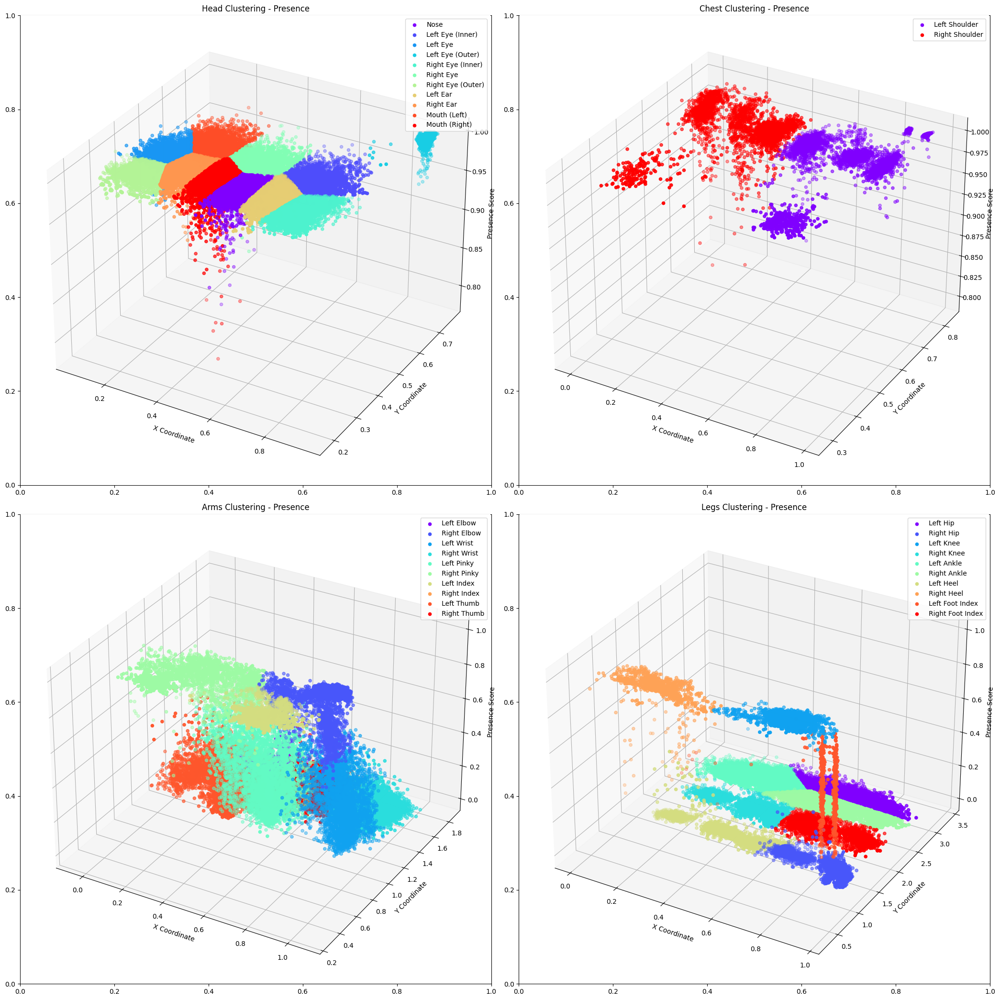

In [19]:
fig, axes = plt.subplots(2, 2, figsize=(21, 21))
axes = axes.flatten()

for idx, (group, parts) in enumerate(groupings.items()):
    data_points = []

    # Collecting data for each group
    for frame_n in range(len(data)):
        pose_data = data.iloc[frame_n]['poses']
        for pose in pose_data:
            for point, part_name in zip(pose, body_parts):
                x, y, _, _, presence = point  # Adjust to capture presence
                if part_name in parts:
                    data_points.append([x, y, presence])

    if data_points:
        data_points = np.array(data_points)
        num_clusters = min(len(parts), len(data_points)) 

        # Perform K-means clustering
        kmeans = KMeans(n_clusters=num_clusters)
        kmeans.fit(data_points)
        labels = kmeans.labels_

        # Generate colors for each body part within the group
        colors = cm.rainbow(np.linspace(0, 1, num_clusters))

        # Plotting the results for this group
        ax = axes[idx]
        ax = fig.add_subplot(2, 2, idx + 1, projection='3d')
        for i in range(num_clusters):
            cluster_points = data_points[labels == i]
            ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
                       color=colors[i], label=parts[i] if i < len(parts) else f'Cluster {i+1}')

        ax.set_title(f'{group} Clustering - Presence')
        ax.set_xlabel('X Coordinate')
        ax.set_ylabel('Y Coordinate')
        ax.set_zlabel('Presence Score')
        ax.legend()

plt.tight_layout()
plt.show()


C:\Users\maria\AppData\Local\Temp\ipykernel_26636\3907511852.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', num_clusters)


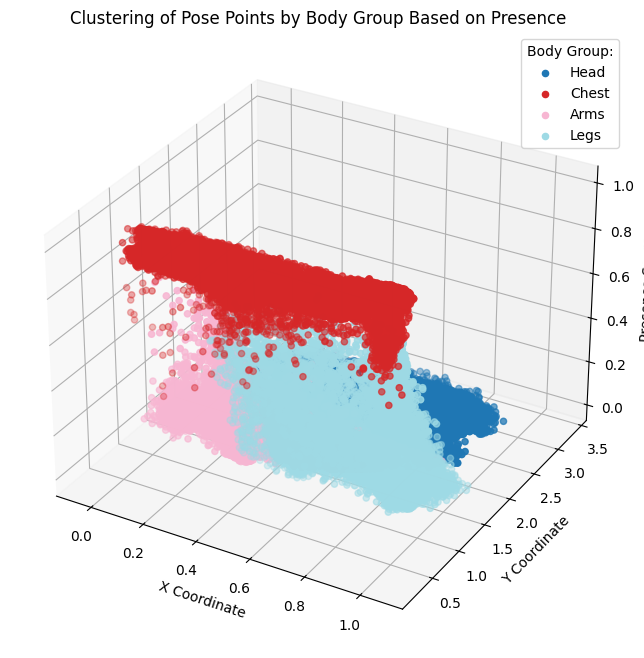

In [20]:
# Assuming 'data' and 'body_parts' are predefined
data_points = []
labels_list = []  # To track which group each point belongs to

# Collect data by group
for frame_n in range(len(data)):
    pose_data = data.iloc[frame_n]['poses']
    for pose in pose_data:
        for point, part_name in zip(pose, body_parts):
            x, y, _, _, presence = point  # Collect presence instead of visibility
            for group, parts in groupings.items():
                if part_name in parts:
                    data_points.append([x, y, presence])  # Use presence score for z-axis data
                    labels_list.append(group)  # Track the group of each point
                    break  # Stop once the correct group is found

# Convert collected data to a NumPy array
data_points = np.array(data_points)

# Map group labels to integers for clustering
unique_labels = list(groupings.keys())
integer_labels = [unique_labels.index(label) for label in labels_list]

# Perform clustering if needed
num_clusters = len(unique_labels)
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(data_points)
labels = kmeans.labels_

# Plotting the results
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Use a colormap with distinct colors for each group
colors = cm.get_cmap('tab20', num_clusters)

for i, group in enumerate(unique_labels):
    # Select data points belonging to the current group
    group_points = data_points[labels == i]
    ax.scatter(group_points[:, 0], group_points[:, 1], group_points[:, 2], color=colors(i), label=group)

ax.set_title('Clustering of Pose Points by Body Group Based on Presence')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Presence Score')
ax.legend(title="Body Group:")
plt.grid(True)
plt.show()

## Collect all pose data


### Emotion Detection

Emotion 1: Surprise
Emotion 2: Sadness


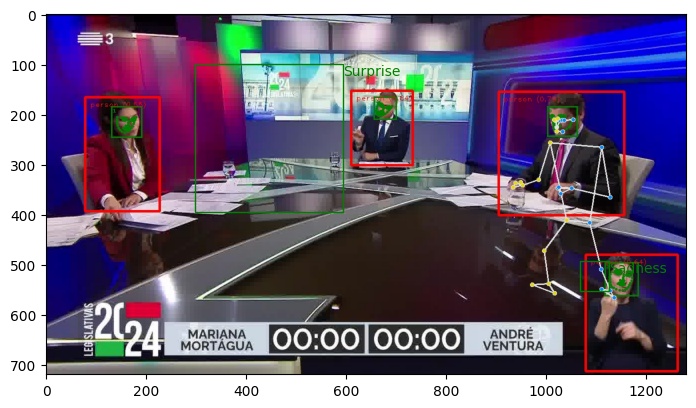

In [66]:
import matplotlib.patches as patches
n = 0
# Facial emotion recognition
idx_to_class={0: 'Anger', 1: 'Contempt', 2: 'Disgust', 3: 'Fear', 4: 'Happiness', 5: 'Neutral', 6: 'Sadness', 7: 'Surprise'}

fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
ax.imshow(img)

width, height = img.size
for fer in data.iloc[frame_n]['fer']:
    n += 1
    
    x = fer['location'][0]
    y = fer['location'][2]
    width = fer['location'][0] - fer['location'][1]
    height = fer['location'][3] - fer['location'][2]

    # Create a rectangle patch
    rect = patches.Rectangle((x, y), width, height, linewidth=1, edgecolor='g', facecolor='none')

    # Add patch to the image
    ax.add_patch(rect)

    ax.text(x, y, fer['emotion'],
            verticalalignment='top',
            color='g')
    print(f"Emotion {n}: {fer['emotion']}")

plt.show()

## Statistical Analysis and Histograms


### Object Frequency


In [22]:
# Calculate and plot the frequency of each detected object
objects = {}
for frame_number in range(len(data)):
    for obj in data.iloc[frame_number]['detections']:
        object_name = obj[4]
        if object_name not in objects:
            objects[object_name] = 1
        else:
            objects[object_name] += 1

object_series = pd.Series(objects)

##### Plots

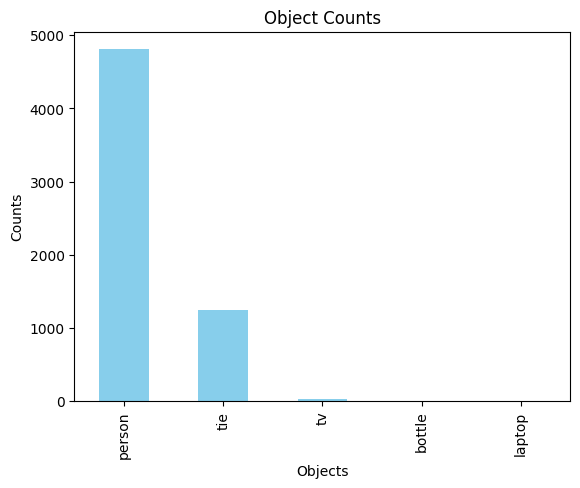

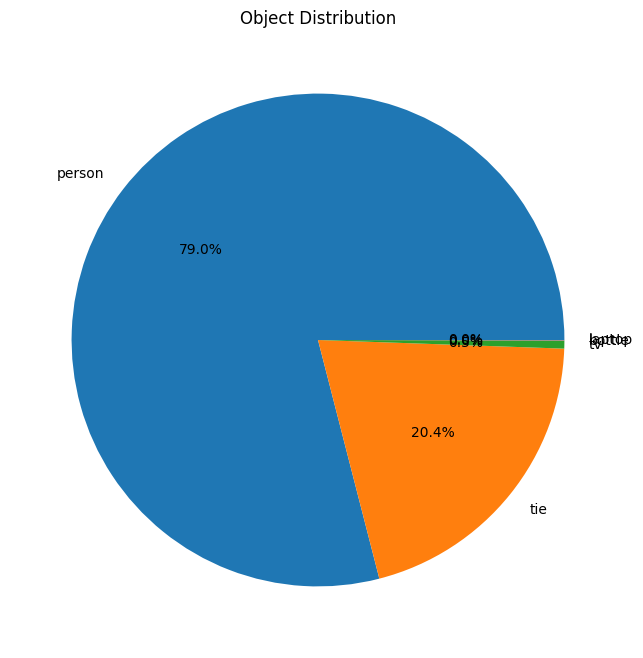

In [23]:
object_series.plot(kind='bar', color='skyblue')
plt.title('Object Counts')
plt.xlabel('Objects')
plt.ylabel('Counts')
plt.show()

# Convert counts to percentages and plot again
object_series = object_series / object_series.sum() * 100
object_series.plot(kind='pie', autopct='%1.1f%%', figsize=(8, 8))
plt.title('Object Distribution')
plt.ylabel('')
plt.show()

##### Confidence Level Analysis


In [24]:
# calculate average of the confidence of each object
objects = []
# save the confidence of each object with a struct for each object
confidence_per_object = {}
object_confidence = 0

for frame_m in range(len(data)):
    for object in data.iloc[frame_m]['detections']:
        objects.append(object[4])
        if object[4] not in confidence_per_object:
            confidence_per_object[object[4]] = []
        confidence_per_object[object[4]].append(object[5])

# Convert the dictionary to a DataFrame
df_confidence_per_object = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in confidence_per_object.items()]))

# Compute summary statistics
summary_statistics = df_confidence_per_object.describe()

print("Summary statistics of the confidence of each object:")
print(summary_statistics)

avg_confidence_per_object = df_confidence_per_object.mean()
print("Average confidence of each object:")
print(avg_confidence_per_object)

Summary statistics of the confidence of each object:
            person          tie         tv  bottle    laptop
count  4809.000000  1244.000000  32.000000     1.0  1.000000
mean      0.850398     0.649662   0.565430     0.5  0.636719
std       0.103664     0.081794   0.045974     NaN       NaN
min       0.500000     0.500000   0.500000     0.5  0.636719
25%       0.789062     0.593750   0.523438     0.5  0.636719
50%       0.886719     0.656250   0.558594     0.5  0.636719
75%       0.933594     0.718750   0.613281     0.5  0.636719
max       0.972656     0.832031   0.656250     0.5  0.636719
Average confidence of each object:
person    0.850398
tie       0.649662
tv        0.565430
bottle    0.500000
laptop    0.636719
dtype: float64


##### Plot these values:

1. Average Condifidence Level for each object

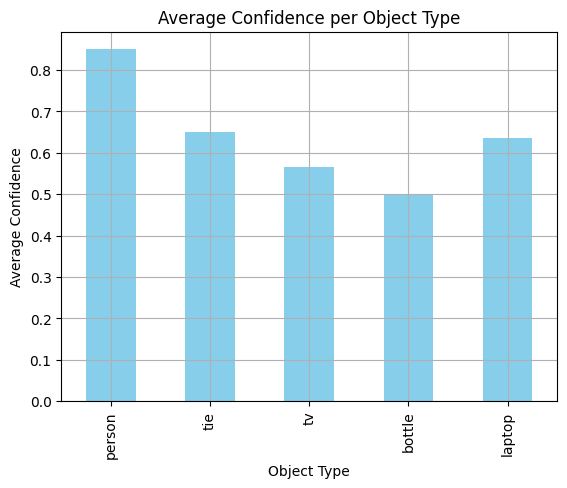

In [25]:
avg_confidence_per_object.plot(kind='bar', color='skyblue')
plt.title('Average Confidence per Object Type')
plt.xlabel('Object Type')
plt.ylabel('Average Confidence')
plt.grid(True)
plt.show()

2. Box Plot

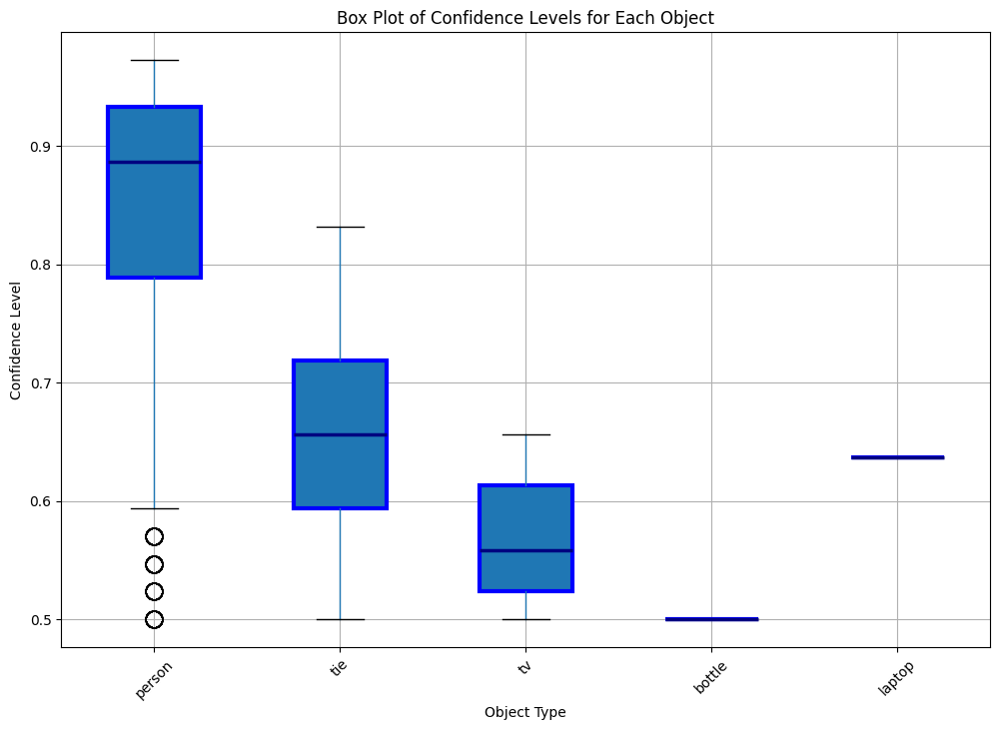

In [26]:
plt.figure(figsize=(12, 8))
boxprops = dict(linestyle='-', linewidth=3, color='blue')
flierprops = dict(marker='o', markersize=12, linestyle='none')
medianprops = dict(linestyle='-', linewidth=2.5, color='navy')
meanprops = dict(marker='^', markeredgecolor='black', markerfacecolor='skyblue')

df_confidence_per_object.boxplot(boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, meanprops=meanprops, patch_artist=True)

plt.title('Box Plot of Confidence Levels for Each Object')
plt.ylabel('Confidence Level')
plt.xlabel('Object Type')
plt.xticks(rotation=45)  # Rotate labels to improve readability if there are many categories
plt.grid(True)
plt.show()

#### Emotions

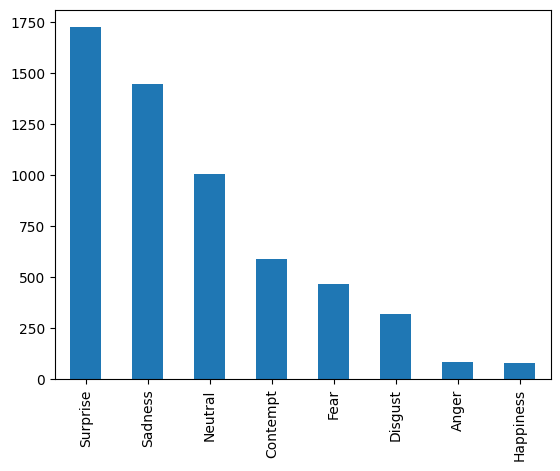

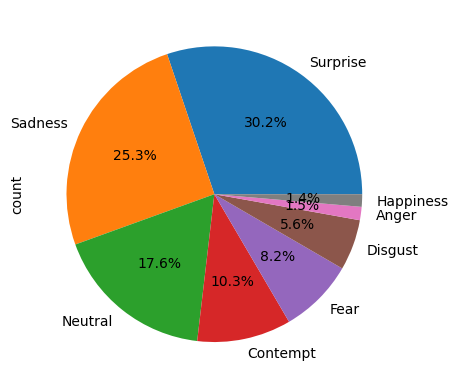

In [27]:
#Emotion histogram
emotions = []
for frame_number in range(len(data)):
    for face in data.iloc[frame_number]['fer']:
        emotions.append(face['emotion'])

emotions = pd.Series(emotions)
emotions.value_counts().plot(kind='bar')

plt.show()
emotions.value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()


## Export Results Based on Number of People Detected

### with information from Fer

In [28]:
number_of_people_frames = []

# Organize and save images based on the number of detected people
for frame_number in range(len(data)):
    n_people = len(data.iloc[frame_number]['fer'])
    number_of_people_frames.append(n_people)
    output_dir = os.path.join(processed_video_dir, 'number_of_people', f'{n_people}_people')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    source_path = os.path.join(processed_video_dir, data.iloc[frame_number]['filename'])
    destination_path = os.path.join(output_dir, data.iloc[frame_number]['filename'])
    if os.path.exists(source_path) and not os.path.exists(destination_path):
        shutil.copy(source_path, destination_path)

print(f"Number of people per frame:" + str(number_of_people_frames))

Number of people per frame:[2, 2, 3, 3, 2, 2, 2, 2, 2, 2, 2, 3, 4, 2, 2, 3, 3, 3, 2, 3, 3, 2, 3, 2, 2, 2, 2, 3, 3, 2, 2, 2, 2, 3, 3, 2, 2, 3, 3, 2, 3, 2, 3, 3, 2, 2, 2, 2, 2, 2, 3, 2, 2, 3, 3, 2, 2, 3, 2, 4, 2, 3, 3, 2, 4, 3, 2, 4, 3, 3, 4, 3, 2, 2, 3, 3, 2, 3, 2, 2, 2, 2, 4, 3, 2, 2, 2, 2, 2, 2, 4, 2, 3, 3, 3, 2, 4, 2, 3, 3, 3, 2, 2, 3, 3, 3, 4, 3, 2, 2, 3, 2, 3, 2, 3, 2, 2, 3, 2, 2, 3, 3, 3, 2, 3, 4, 2, 2, 3, 3, 2, 3, 2, 2, 4, 3, 2, 2, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 3, 3, 4, 2, 2, 3, 2, 4, 2, 3, 2, 2, 3, 2, 2, 3, 2, 2, 2, 3, 3, 2, 4, 2, 2, 3, 3, 2, 2, 2, 3, 2, 3, 3, 3, 3, 2, 3, 3, 2, 2, 4, 2, 3, 3, 2, 3, 3, 3, 3, 3, 2, 3, 3, 2, 3, 4, 3, 3, 3, 3, 2, 5, 4, 2, 3, 2, 4, 3, 4, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 3, 2, 2, 2, 4, 3, 3, 3, 2, 2, 3, 2, 2, 3, 2, 3, 2, 3, 3, 2, 3, 2, 2, 2, 3, 2, 3, 2, 2, 2, 3, 3, 3, 4, 2, 3, 3, 2, 3, 3, 3, 2, 2, 2, 3, 2, 2, 2, 2, 3, 3, 4, 2, 3, 2, 2, 3, 4, 2, 3, 3, 2, 3, 3, 2, 2, 2, 3, 4, 3, 2, 3, 2, 2, 3, 2, 2, 3, 3, 4, 2, 3, 3, 2, 2, 2, 3, 2, 3, 4, 3, 4, 3, 

#### Display Images

from folder: processed\chega-be\number_of_people\1_people


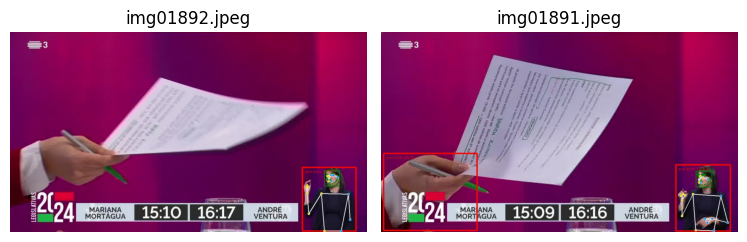

from folder: processed\chega-be\number_of_people\2_people


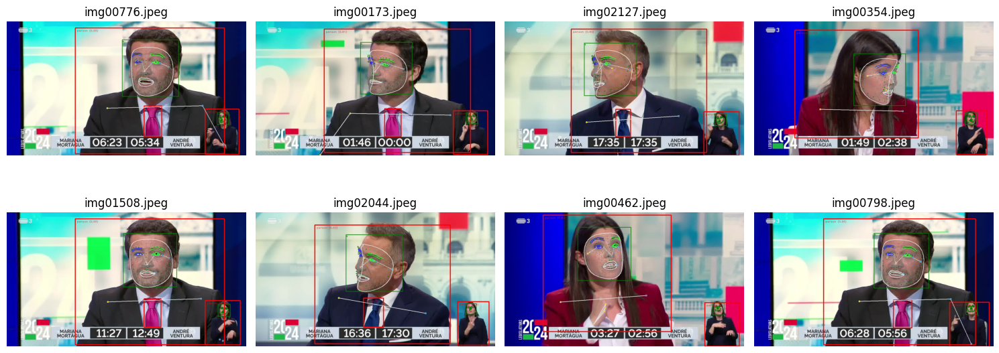

from folder: processed\chega-be\number_of_people\3_people


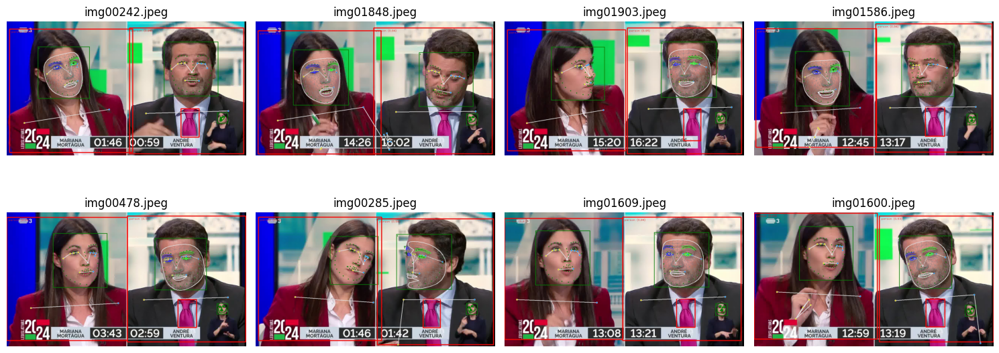

from folder: processed\chega-be\number_of_people\4_people


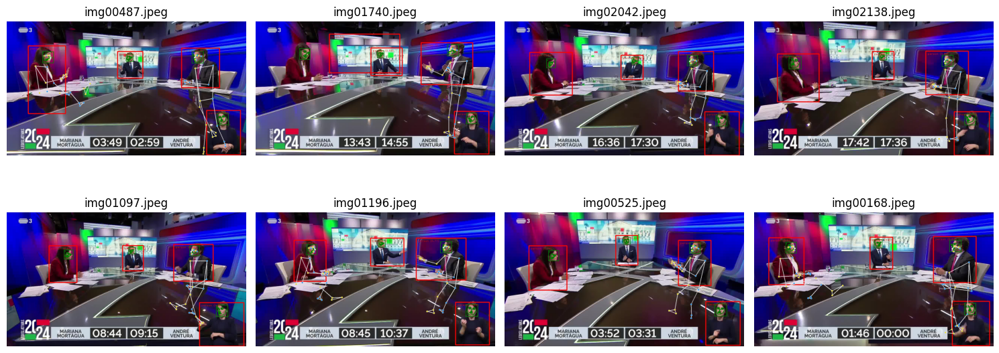

from folder: processed\chega-be\number_of_people\5_people


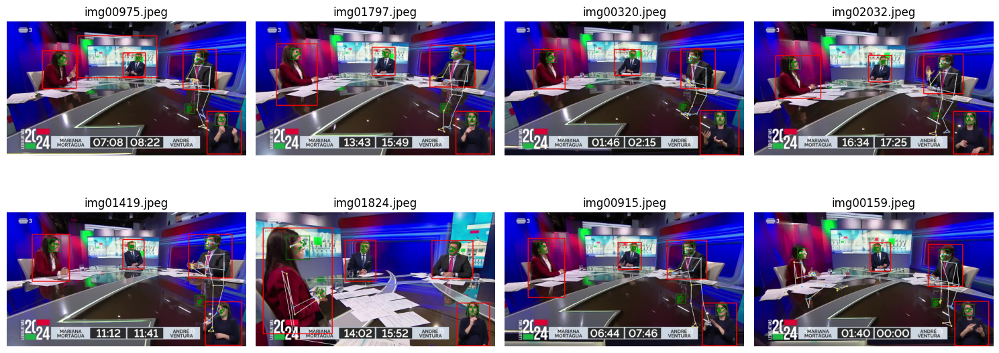

In [29]:
base_dir = os.path.join(processed_video_dir, 'number_of_people')

people_folders = [os.path.join(base_dir, folder) for folder in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, folder))]

number_of_people = 0

for folder in people_folders:
    number_of_people += 1
    print(f"from folder: {folder}")

    images = [os.path.join(folder, img) for img in os.listdir(folder) if img.endswith(('.png', '.jpg', '.jpeg'))]

    selected_images = random.sample(images, min(8, len(images)))
    n_rows = (len(selected_images) + 6) // 4
    plt.figure(figsize=(15, 3 * n_rows)) 
    for idx, image_path in enumerate(selected_images):
        img = Image.open(image_path)
        ax = plt.subplot(n_rows, 4, idx + 1)
        plt.imshow(img)
        plt.title(os.path.basename(image_path))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

#### Clustering: Number of people in each frame 

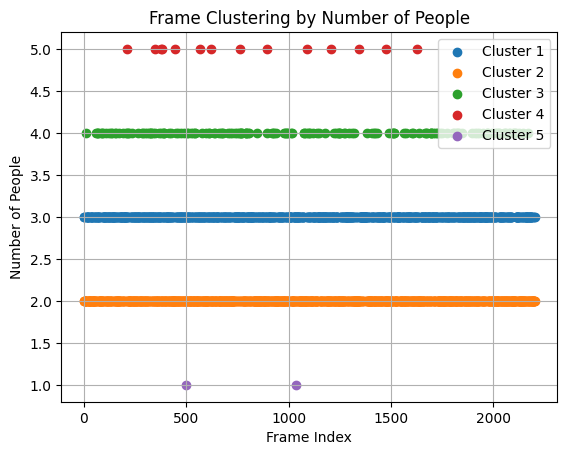

In [30]:
def plot_clusters(number_of_people_frames):
    # Clustering the data
    data_array = np.array(number_of_people_frames).reshape(-1, 1)
    kmeans = KMeans(5, random_state=42)  # Choose the number of clusters based on your earlier analysis
    clusters = kmeans.fit_predict(data_array)
    unique_clusters = sorted(set(clusters))

    for cluster in unique_clusters:
        mask = clusters == cluster
        plt.scatter(np.array(range(len(number_of_people_frames)))[mask], np.array(number_of_people_frames)[mask], label=f'Cluster {cluster+1}')

    plt.title('Frame Clustering by Number of People')
    plt.xlabel('Frame Index')
    plt.ylabel('Number of People')
    plt.grid(True)
    plt.legend()  # This line adds the legend
    plt.show()

plot_clusters(number_of_people_frames)

### with information from detections of people

In [31]:
number_of_people_frames = []

for frame_number in range(len(data)):
    n_people = 0
    for face in data.iloc[frame_number]['detections']:
        if face[4] == 'person':
            n_people += 1
    number_of_people_frames.append(n_people)
    output_dir = os.path.join(processed_video_dir, 'number_of_people_detections', f'{n_people}_people')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    source_path = os.path.join(processed_video_dir, data.iloc[frame_number]['filename'])
    destination_path = os.path.join(output_dir, data.iloc[frame_number]['filename'])
    if os.path.exists(source_path) and not os.path.exists(destination_path):
        shutil.copy(source_path, destination_path)

#### Display Images

from folder: processed\chega-be\number_of_people_detections\1_people


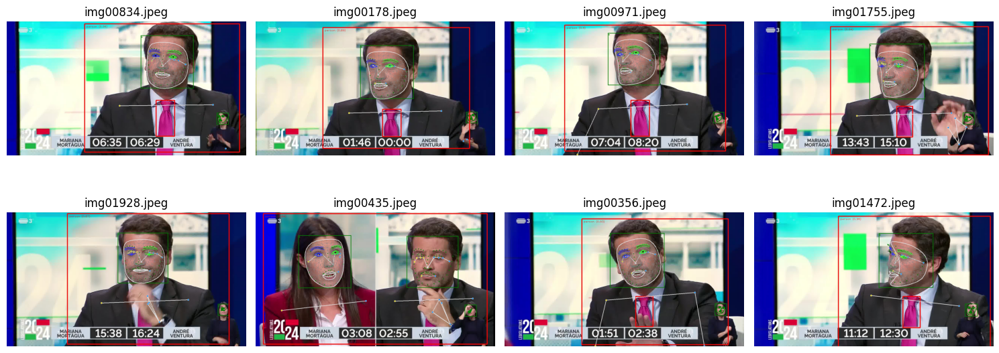

from folder: processed\chega-be\number_of_people_detections\2_people


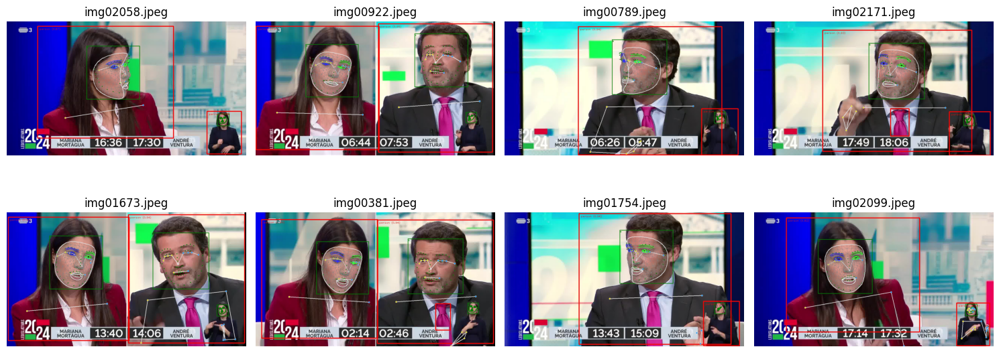

from folder: processed\chega-be\number_of_people_detections\3_people


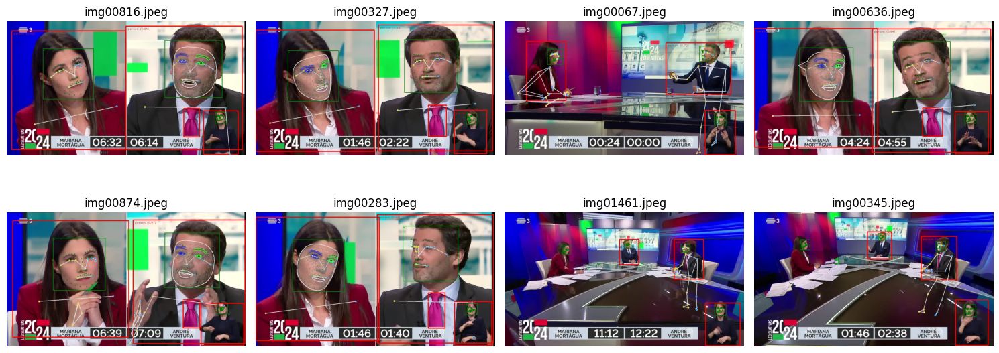

from folder: processed\chega-be\number_of_people_detections\4_people


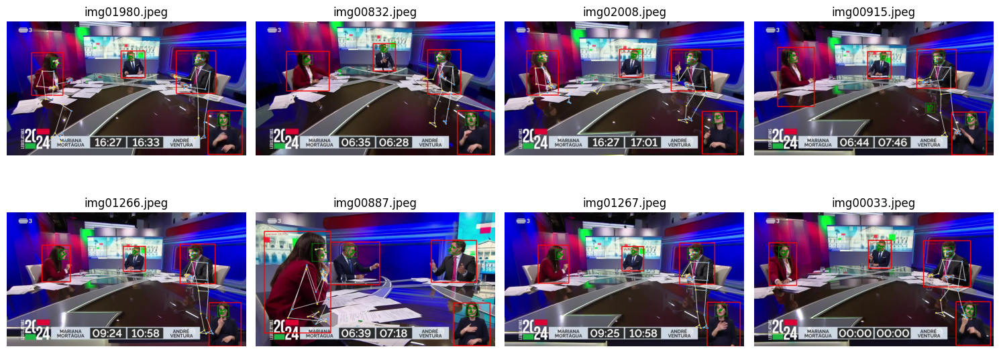

In [32]:
base_dir = os.path.join(processed_video_dir, 'number_of_people_detections')

people_folders = [os.path.join(base_dir, folder) for folder in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, folder))]

number_of_people = 0
for folder in people_folders:
    number_of_people += 1
    print(f"from folder: {folder}")
    images = [os.path.join(folder, img) for img in os.listdir(folder) if img.endswith(('.png', '.jpg', '.jpeg'))]

    selected_images = random.sample(images, min(8, len(images)))
    n_rows = (len(selected_images) + 6) // 4
    plt.figure(figsize=(15, 3 * n_rows)) 
    for idx, image_path in enumerate(selected_images):
        img = Image.open(image_path)
        ax = plt.subplot(n_rows, 4, idx + 1)
        plt.imshow(img)
        plt.title(os.path.basename(image_path))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

C:\Users\maria\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1474: ConvergenceWarning: Number of distinct clusters (4) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


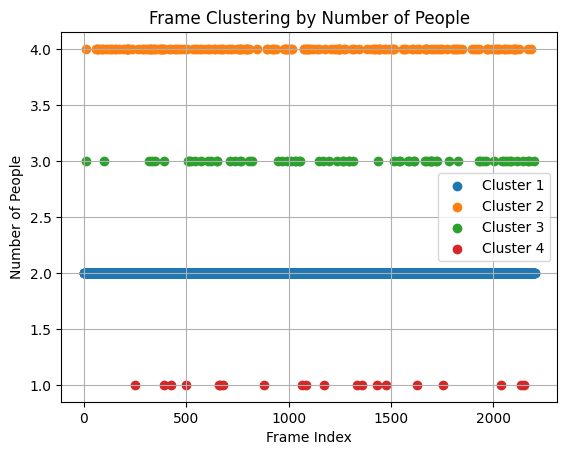

In [33]:
plot_clusters(number_of_people_frames)